# MODEL FORM SCRATCH

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization, Activation, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
from tensorflow.keras.metrics import MeanIoU
from tqdm import tqdm
import cv2

# Define color mapping for masks
class_to_color = {
    10: (250, 149, 10),  # Orange - Hood
    20: (19, 98, 19),    # Dark Green - Front Door
    30: (249, 249, 10),  # Yellow - Rear Door
    40: (10, 248, 250),  # Cyan - Frame
    50: (149, 7, 149),   # Purple - Rear Quarter Panel
    60: (5, 249, 9),     # Light Green - Trunk Lid
    70: (20, 19, 249),   # Blue - Fender
    80: (249, 9, 250),   # Pink - Bumper
    90: (0, 0, 0)        # Black for "rest of car"
}


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


These functions dynamically loads images and masks in batches to efficiently manage RAM usage for large datasets, while simultaneously preprocessing the masks. It normalizes the mask values and converts them into one-hot encoded formats, essential for deep learning segmentation tasks.

In [2]:
# Function to preprocess masks
def preprocess_mask(mask, num_classes=9):
    mask = np.clip((mask - 10) / 10, 0, num_classes - 1)
    return to_categorical(mask, num_classes)

# Function to generate data in batches
def data_generator(file_names, data_directory, batch_size, num_classes=9, target_size=(224, 224)):
    while True:
        np.random.shuffle(file_names)
        for i in range(0, len(file_names), batch_size):
            batch_files = file_names[i:i + batch_size]
            images, masks = [], []

            for file in batch_files:
                data = np.load(os.path.join(data_directory, file))

                # Resize the image if it's not the target size
                if data.shape[:2] != target_size:
                    image = cv2.resize(data[:, :, :3], (224, 224))
                    images.append(image)
                    mask = preprocess_mask(data[:, :, 3], num_classes)
                    mask = cv2.resize(mask, (224, 224), interpolation=cv2.INTER_NEAREST)
                    masks.append(mask)
                else:
                    images.append(data[:, :, :3])
                    mask = preprocess_mask(data[:, :, 3], num_classes)
                    masks.append(mask)

            yield np.array(images), np.array(masks)

These functions constructs convolutional layers with batch normalization and ReLU activation for neural networks, while outlines the U-Net architecture, incorporating encoding and decoding paths with a bottleneck, for efficient semantic image segmentation tasks.The

In [3]:
def conv_block(input_tensor, num_filters):
    x = Conv2D(num_filters, (3, 3), padding="same")(input_tensor)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, (3, 3), padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    return x

def unet(input_size=(224, 224, 3), num_classes=9):
    inputs = Input(input_size)

    # Encoding path
    c1 = conv_block(inputs, 64)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(0.1)(p1)

    c2 = conv_block(p1, 128)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(0.1)(p2)

    c3 = conv_block(p2, 256)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(0.2)(p3)

    c4 = conv_block(p3, 512)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)
    p4 = Dropout(0.2)(p4)
    
    # Bottleneck
    c5 = conv_block(p4, 1024)
    c5 = Dropout(0.3)(c5)

    # Decoding path
    u6 = UpSampling2D((2, 2))(c5)
    u6 = concatenate([u6, c4])
    c6 = conv_block(u6, 512)
    c6 = Dropout(0.2)(c6)

    u7 = UpSampling2D((2, 2))(c6)
    u7 = concatenate([u7, c3])
    c7 = conv_block(u7, 256)
    c7 = Dropout(0.2)(c7)

    u8 = UpSampling2D((2, 2))(c7)
    u8 = concatenate([u8, c2])
    c8 = conv_block(u8, 128)
    c8 = Dropout(0.1)(c8)

    u9 = UpSampling2D((2, 2))(c8)
    u9 = concatenate([u9, c1])
    c9 = conv_block(u9, 64)
    c9 = Dropout(0.1)(c9)

    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(c9)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model


Early stopping and model checkpoints are define

In [4]:
# Early stopping and model checkpoint callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=3, verbose=1, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('unet_best_model.h5', monitor='val_loss', save_best_only=True, verbose=1)


Train and test split of the images

In [5]:
dataset_directory = '/kaggle/input/final-data-v3/arrays_processed/'
file_names = os.listdir(dataset_directory)
print(len(file_names))

train_files, val_files = train_test_split(file_names, test_size=0.2, random_state=42)


11503


Definition of dice coefficient and dice loss function, to use as metrics for the model

In [4]:
import tensorflow.keras.backend as K

def dice_coef(y_true, y_pred, smooth=1e-7):
    # Flatten the tensors
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    # Compute the intersection and sum of true and predicted values
    intersection = K.sum(y_true_f * y_pred_f)
    sum_true_pred = K.sum(y_true_f) + K.sum(y_pred_f)
    # Compute Dice coefficient
    return K.mean((2. * intersection + smooth) / (sum_true_pred + smooth))

def dice_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)


Configuration of the GPU settings for efficient memory management, and then use of the MirroredStrategy for distributed training, setting up and compiling of the U-Net model with appropriate loss and metrics for semantic image segmentation

In [7]:
import tensorflow as tf

# Check the available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        print(e)

# Using MirroredStrategy
strategy = tf.distribute.MirroredStrategy()

print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

# Initialize and compile the U-Net model
with strategy.scope():
    model = unet()
    model.compile(optimizer=Adam(lr=1e-4), loss= dice_loss,
              metrics=['accuracy', MeanIoU(num_classes=9), dice_coef])
    

2 Physical GPUs, 2 Logical GPUs
Number of devices: 2


Split of the images using the dataset directory split

In [8]:
train_gen = data_generator(train_files, dataset_directory, batch_size=16, num_classes=9)
val_gen = data_generator(val_files, dataset_directory, batch_size=16, num_classes=9)

Checking the reading of the images and masks

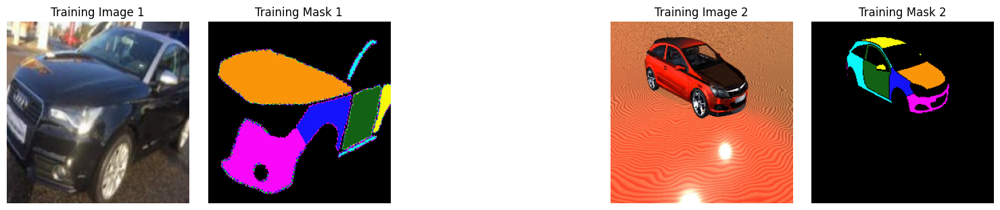

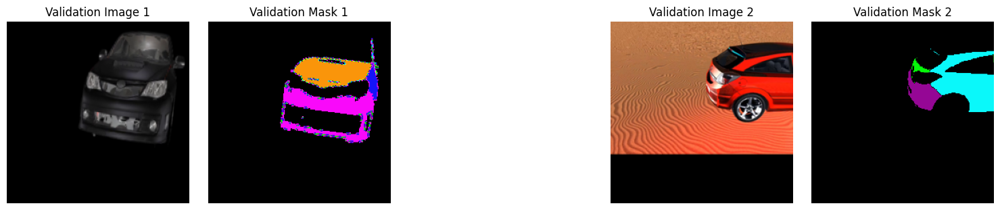

In [9]:
train_images, train_masks = next(train_gen)
val_images, val_masks = next(val_gen)

def display_images(images, masks, title):
    plt.figure(figsize=(18, 6))
    for i in range(min(2, len(images))):  
        # Normalize image data if necessary
        image = images[i] / 255.0 if images[i].max() > 1.0 else images[i]

        # Display original image
        plt.subplot(2, 6, i * 3 + 1)
        plt.imshow(image, cmap='gray' if image.shape[2] == 1 else None)
        plt.title(f"{title} Image {i+1}")
        plt.axis('off')

        # Reverse mask preprocessing
        mask = np.argmax(masks[i], axis=-1)  
        mask += 1
        mask = (mask * 10) 
        
        # Create an empty RGB image
        colored_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)

        # Map each class label in the mask to its corresponding color
        for class_value, color in class_to_color.items():
            colored_mask[mask == class_value] = color

        # Display mask
        plt.subplot(2, 6, i * 3 + 2)
        plt.imshow(colored_mask)
        plt.title(f"{title} Mask {i+1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Display images and masks from training and validation sets
display_images(train_images, train_masks, "Training")
display_images(val_images, val_masks, "Validation")

Definition of the history checkpoint

In [10]:
import pickle
from tensorflow.keras.callbacks import Callback

class HistoryCheckpoint(Callback):
    def __init__(self, history_file_path):
        super(HistoryCheckpoint, self).__init__()
        self.history_file_path = history_file_path

    def on_epoch_end(self, epoch, logs=None):
        with open(self.history_file_path, 'wb') as file_pi:
            pickle.dump(self.model.history.history, file_pi)

Training of the model, using 50 epcohs and batches of 16

In [11]:
history_checkpoint = HistoryCheckpoint('model_history.pkl')

history = model.fit(train_gen, steps_per_epoch=len(train_files)//16, epochs=50, validation_data=val_gen, validation_steps=len(val_files)//16,callbacks=[early_stopping, model_checkpoint, history_checkpoint])


Epoch 1/50


2023-12-19 19:52:43.488115: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


575/575 [==============================] - ETA: 0s - loss: 0.1640 - accuracy: 0.8570 - mean_io_u: 0.4462 - dice_coef: 0.8360
Epoch 1: val_loss improved from inf to 0.12834, saving model to unet_best_model.h5


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


575/575 [==============================] - 582s 930ms/step - loss: 0.1640 - accuracy: 0.8570 - mean_io_u: 0.4462 - dice_coef: 0.8360 - val_loss: 0.1283 - val_accuracy: 0.8727 - val_mean_io_u: 0.4513 - val_dice_coef: 0.8716
Epoch 2/50
575/575 [==============================] - ETA: 0s - loss: 0.1210 - accuracy: 0.8796 - mean_io_u: 0.4483 - dice_coef: 0.8790
Epoch 2: val_loss improved from 0.12834 to 0.11922, saving model to unet_best_model.h5
575/575 [==============================] - 461s 802ms/step - loss: 0.1210 - accuracy: 0.8796 - mean_io_u: 0.4483 - dice_coef: 0.8790 - val_loss: 0.1192 - val_accuracy: 0.8811 - val_mean_io_u: 0.4447 - val_dice_coef: 0.8808
Epoch 3/50
575/575 [==============================] - ETA: 0s - loss: 0.1099 - accuracy: 0.8904 - mean_io_u: 0.4508 - dice_coef: 0.8902
Epoch 3: val_loss improved from 0.11922 to 0.11655, saving model to unet_best_model.h5
575/575 [==============================] - 441s 767ms/step - loss: 0.1099 - accuracy: 0.8904 - mean_io_u: 0.

Saving the model and the history

In [12]:
# Save the final model
model.save('final_unet_model.h5')

In [13]:
import pickle

# Save the history
with open('final_model_history.pkl', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

In [14]:
import json

with open('final_model_history.json', 'w') as f:
    json.dump(history.history, f)

## EVALUATE

Loading the previously saved model and history

In [5]:
from tensorflow.keras.models import load_model
import pickle

model = load_model('/kaggle/input/model-final-fixed/final_unet_model.h5', 
                   custom_objects={'dice_coef': dice_coef, 'dice_loss': dice_loss})# Load the training history
with open('/kaggle/input/model-final-fixed/final_model_history.pkl', 'rb') as file:
    history = pickle.load(file)

Display of the model loss and model dice coefficinet during the training

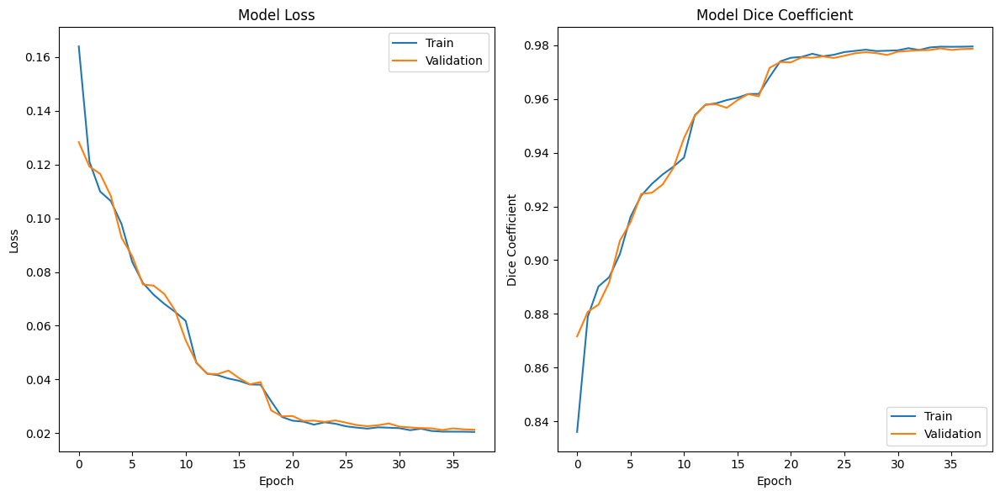

In [6]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

# Plot training & validation dice coefficient values
plt.subplot(1, 2, 2)
plt.plot(history['dice_coef'])  
plt.plot(history['val_dice_coef'])  
plt.title('Model Dice Coefficient')
plt.xlabel('Epoch')
plt.ylabel('Dice Coefficient')
plt.legend(['Train', 'Validation'], loc='lower right')

plt.tight_layout()
plt.show()

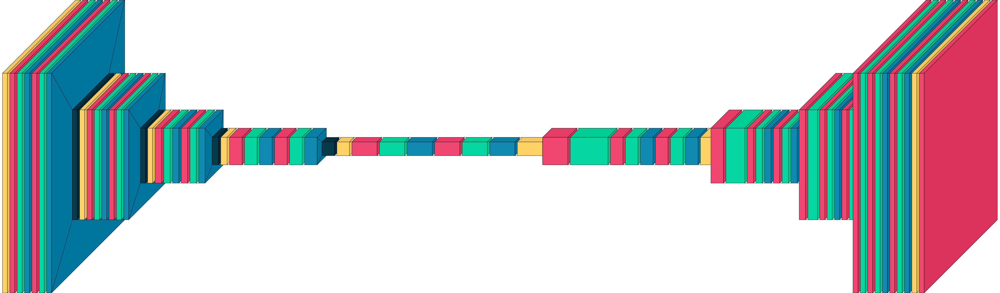

In [28]:
import visualkeras
visualkeras.layered_view(model)

Load the images from the test dataset

In [31]:
test_directory = "/kaggle/input/test-data/test"
test_files = os.listdir(test_directory)
test_gen = data_generator(test_files, test_directory, batch_size=16, num_classes=9)


Evaluation of the model with three different samples, with the corresponding metrics

In [32]:
# Evaluate the model on the training data
train_metrics = model.evaluate(train_gen, steps=len(train_files)//16)
print("Training Data Evaluation:")
print(f"Loss: {train_metrics[0]}, Accuracy: {train_metrics[1]}, Mean IoU: {train_metrics[2]}, Dice Coefficient: {train_metrics[3]}")

# Evaluate the model on the validation data
val_metrics = model.evaluate(val_gen, steps=len(val_files)//16)
print("Validation Data Evaluation:")
print(f"Loss: {val_metrics[0]}, Accuracy: {val_metrics[1]}, Mean IoU: {val_metrics[2]}, Dice Coefficient: {val_metrics[3]}")

# Evaluate the model on the test data
test_metrics = model.evaluate(test_gen, steps=len(test_files)//16)
print("Test Data Evaluation:")
print(f"Loss: {test_metrics[0]}, Accuracy: {test_metrics[1]}, Mean IoU: {test_metrics[2]}, Dice Coefficient: {test_metrics[3]}")


575/575 [==============================] - 147s 255ms/step - loss: 0.0198 - accuracy: 0.9803 - mean_io_u: 0.9780 - dice_coef: 0.9803
Training Data Evaluation:
Loss: 0.019767187535762787, Accuracy: 0.9802574515342712, Mean IoU: 0.9779585599899292, Dice Coefficient: 0.9802578091621399
143/143 [==============================] - 36s 254ms/step - loss: 0.0212 - accuracy: 0.9789 - mean_io_u: 0.9765 - dice_coef: 0.9788
Validation Data Evaluation:
Loss: 0.02115277759730816, Accuracy: 0.9788712859153748, Mean IoU: 0.9764904379844666, Dice Coefficient: 0.9788418412208557
1/1 [==============================] - 1s 886ms/step - loss: 0.0265 - accuracy: 0.9736 - mean_io_u: 0.9691 - dice_coef: 0.9735
Test Data Evaluation:
Loss: 0.026467978954315186, Accuracy: 0.9735705256462097, Mean IoU: 0.9690511226654053, Dice Coefficient: 0.9735320210456848


Definition of the function to display the real image, the true mask and the predicted mask

In [33]:
import matplotlib.pyplot as plt
import numpy as np

def display_predictions_from_generator(model, data_gen, class_to_color, num_examples=5):
    for i in range(num_examples):
        # Fetch a batch of images and their true masks from the data generator
        images, true_masks = next(data_gen)
        image = images[0]  
        true_mask = true_masks[0] 
        
        # Predict the mask for the image
        pred_mask_probabilities = model.predict(np.expand_dims(image, axis=0))[0]
        pred_mask = np.argmax(pred_mask_probabilities, axis=-1) * 10 + 10 

        # Reverse mask preprocessing for true mask
        true_mask = np.argmax(true_mask, axis=-1) * 10 + 10
        true_colored_mask = np.zeros((*true_mask.shape, 3), dtype=np.uint8)
        pred_colored_mask = np.zeros_like(true_colored_mask)
        for class_value, color in class_to_color.items():
            true_colored_mask[true_mask == class_value] = color
            pred_colored_mask[pred_mask == class_value] = color

        # Normalize image for display if it's not in the 0-1 range
        if image.max() > 1.0:
            image = image / 255.0
        
        # Display the images
        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(true_colored_mask)
        plt.title("True Mask")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(pred_colored_mask)
        plt.title("Predicted Mask")
        plt.axis('off')

        plt.show()

Display of the orginal image, true mask and predicted maskfor the training sample

1/1 [==============================] - 0s 409ms/step


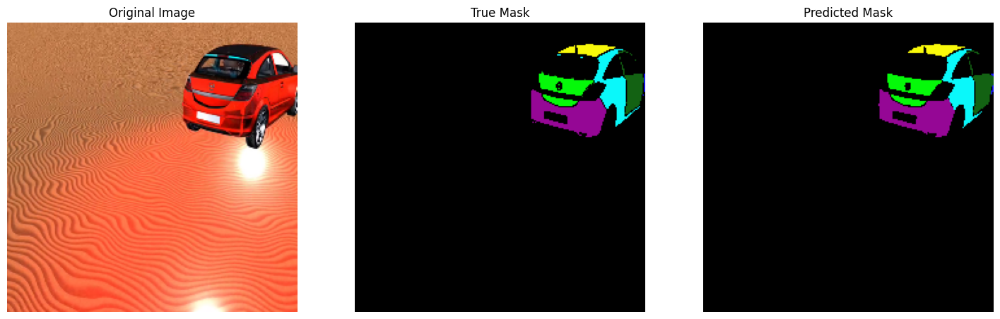

1/1 [==============================] - 0s 22ms/step


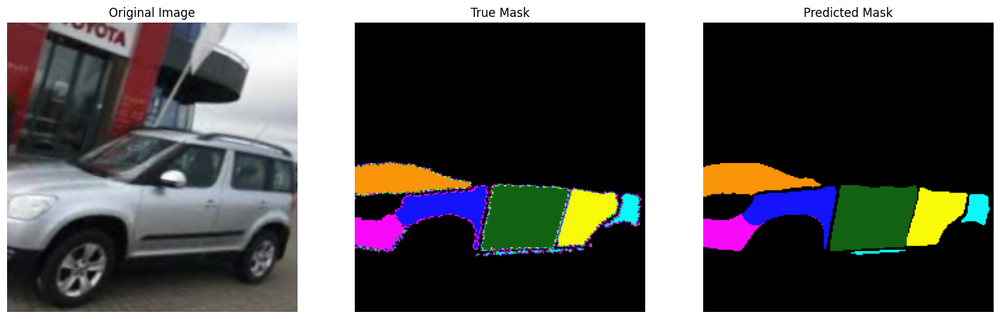

1/1 [==============================] - 0s 24ms/step


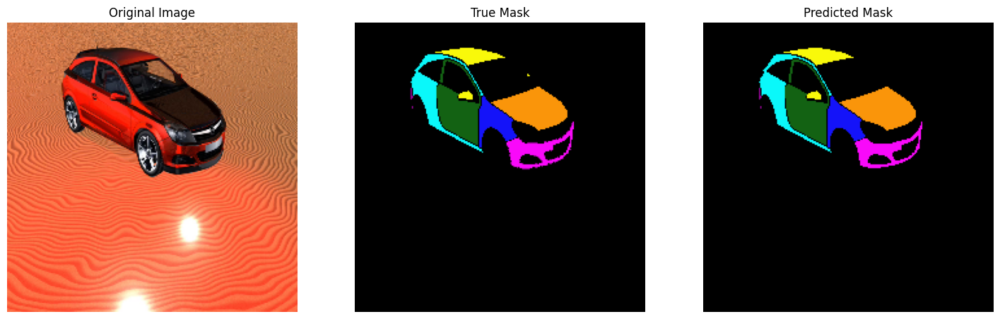

1/1 [==============================] - 0s 23ms/step


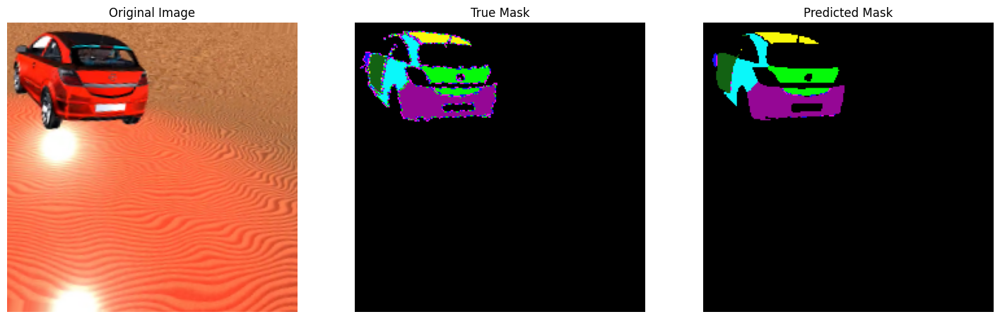

1/1 [==============================] - 0s 22ms/step


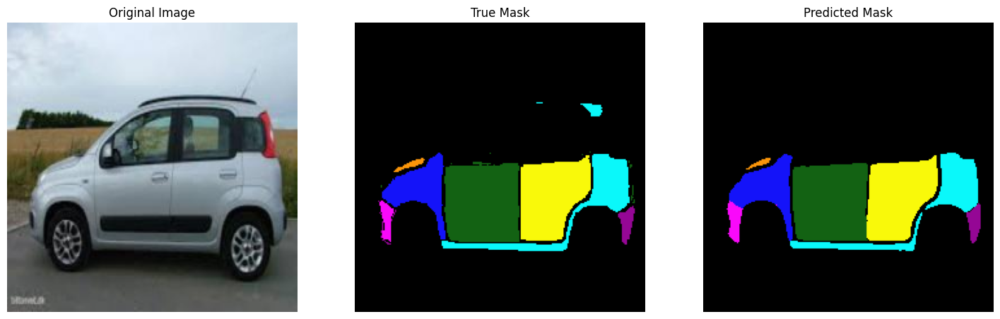

In [36]:
display_predictions_from_generator(model, train_gen, class_to_color, num_examples=5)

Display of the orginal image, true mask and predicted maskfor the validation sample

1/1 [==============================] - 0s 21ms/step


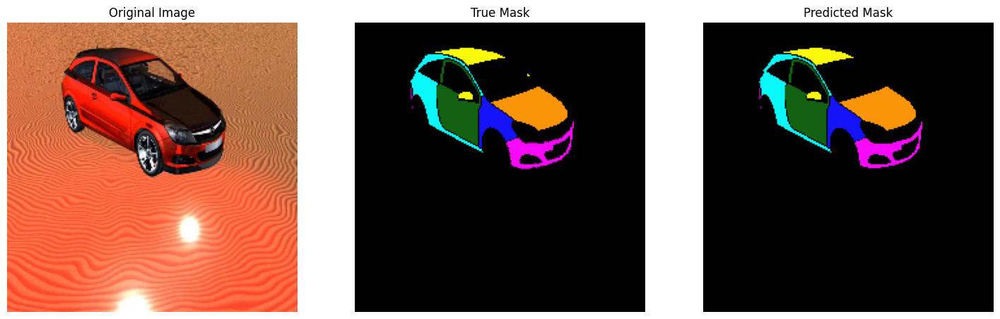

1/1 [==============================] - 0s 22ms/step


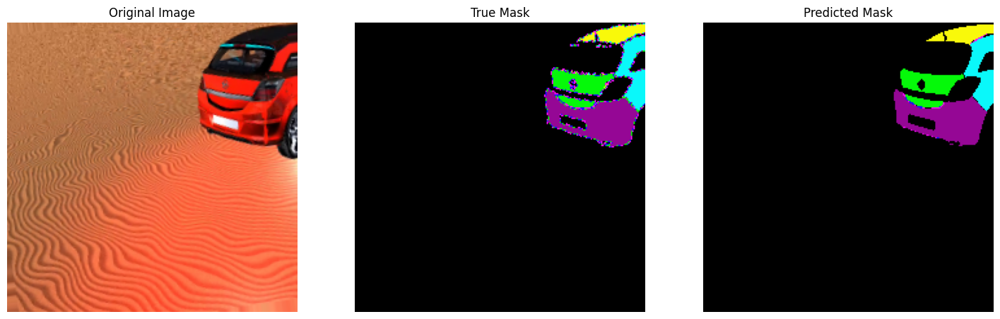

1/1 [==============================] - 0s 22ms/step


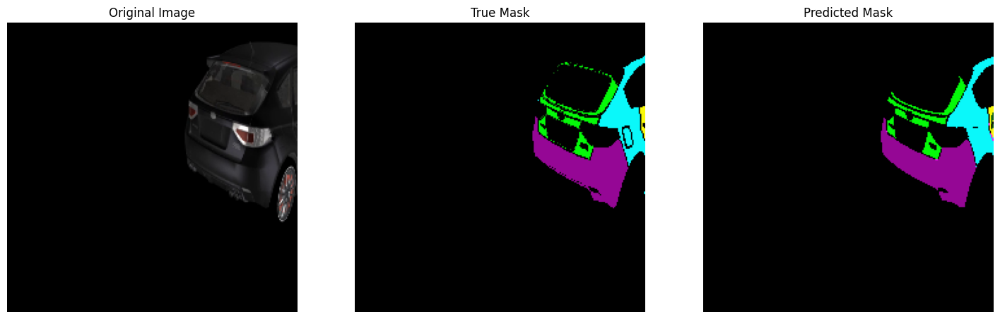

1/1 [==============================] - 0s 21ms/step


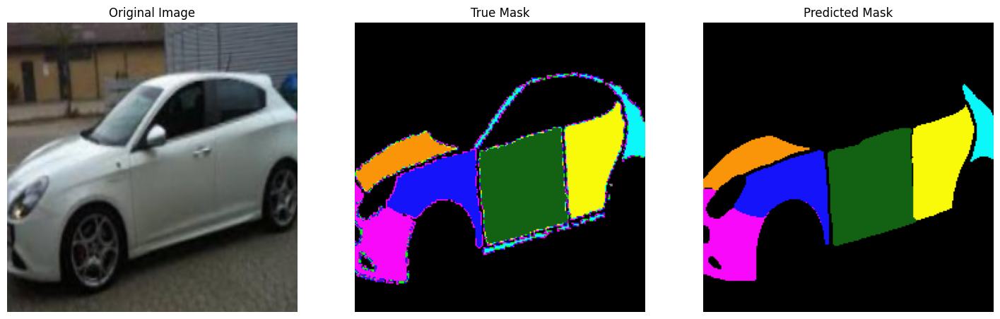

1/1 [==============================] - 0s 21ms/step


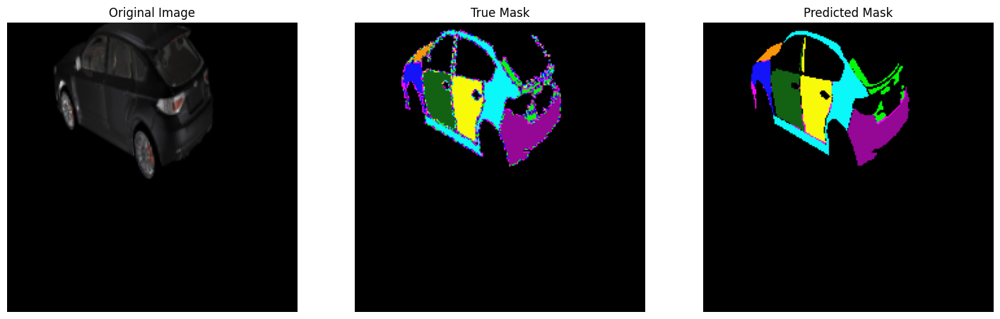

In [37]:
display_predictions_from_generator(model, val_gen, class_to_color, num_examples=5)

Display of the orginal image, true mask and predicted maskfor the test sample

1/1 [==============================] - 0s 22ms/step


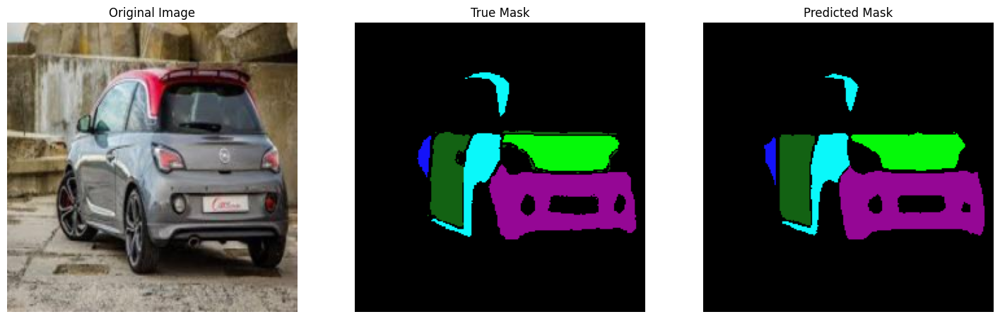

1/1 [==============================] - 0s 21ms/step


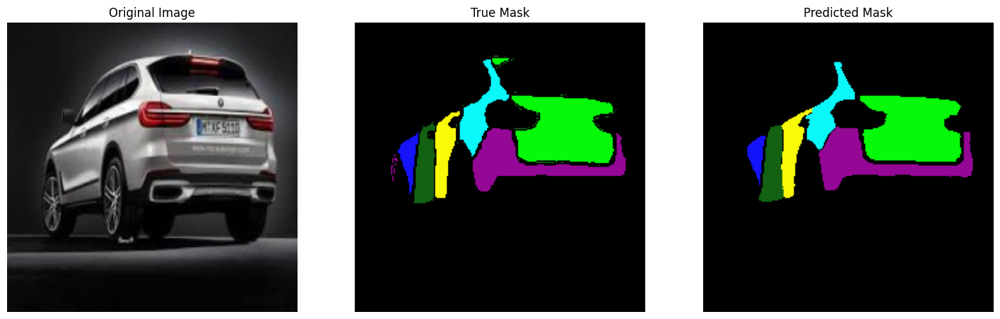

1/1 [==============================] - 0s 22ms/step


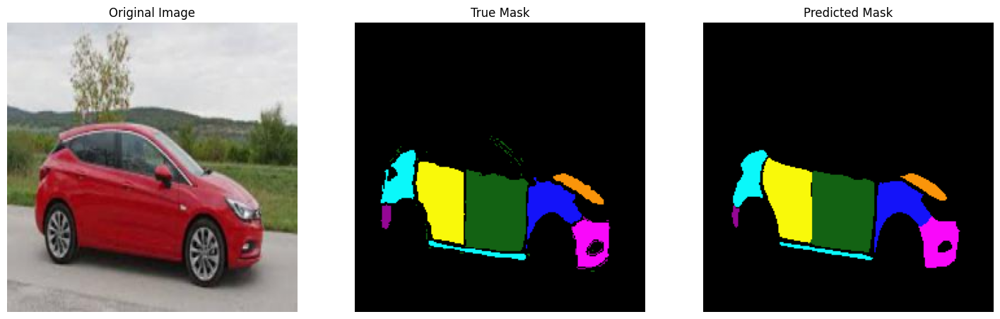

1/1 [==============================] - 0s 22ms/step


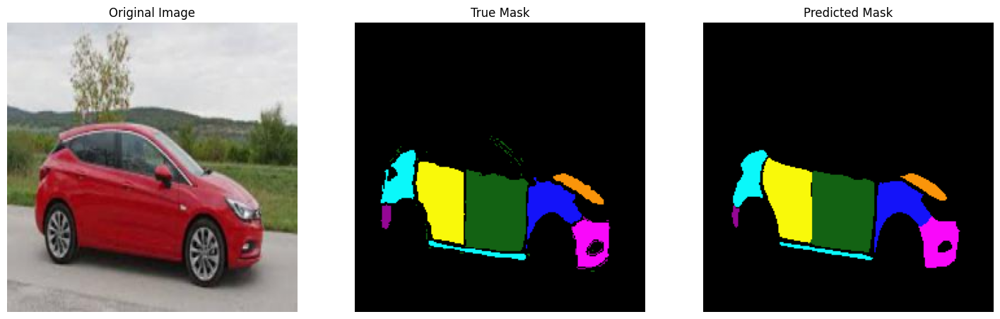

1/1 [==============================] - 0s 22ms/step


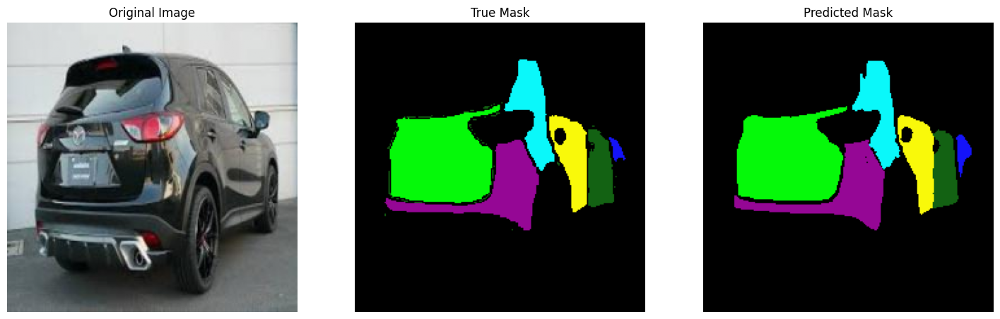

1/1 [==============================] - 0s 21ms/step


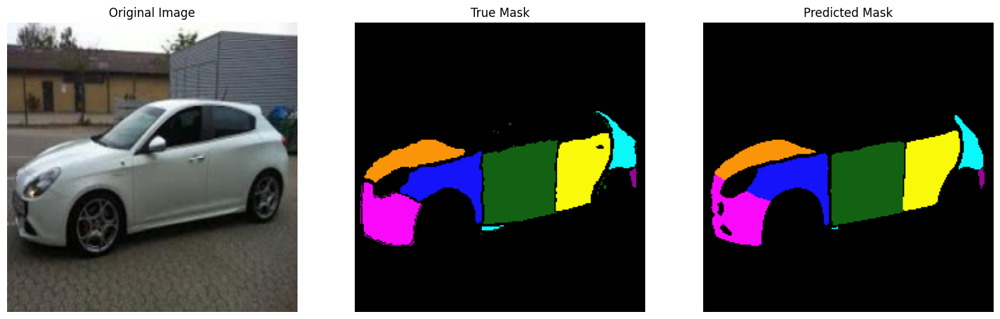

1/1 [==============================] - 0s 21ms/step


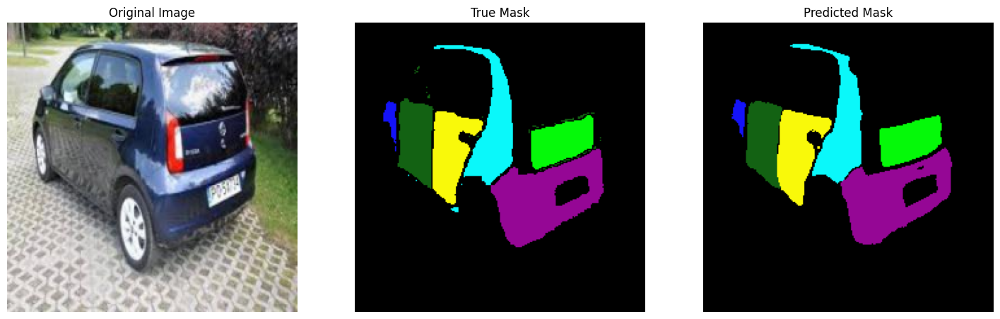

1/1 [==============================] - 0s 21ms/step


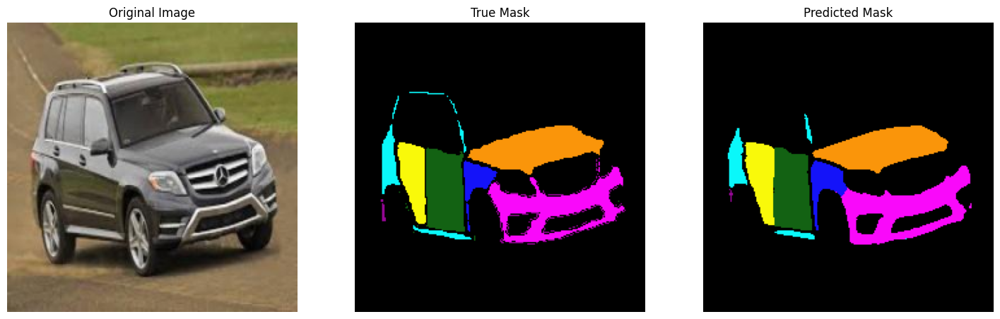

1/1 [==============================] - 0s 21ms/step


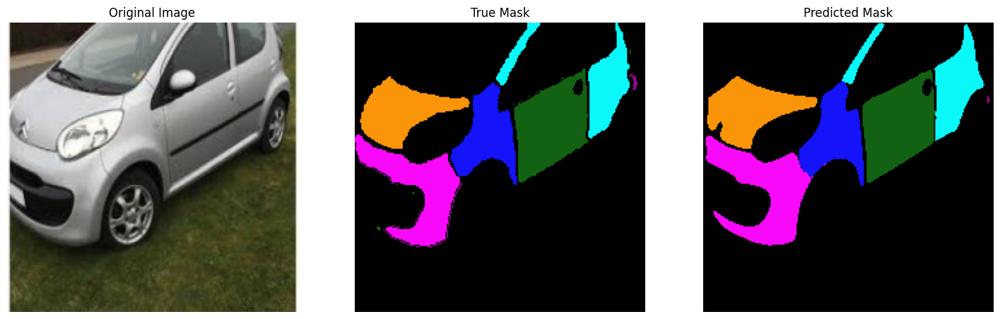

1/1 [==============================] - 0s 21ms/step


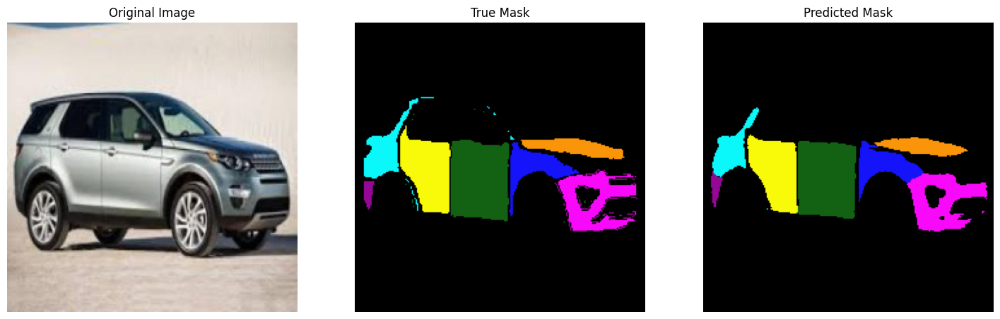

1/1 [==============================] - 0s 21ms/step


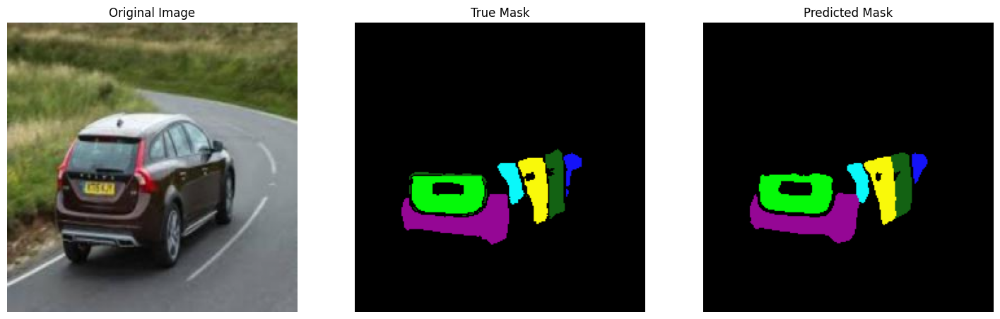

1/1 [==============================] - 0s 22ms/step


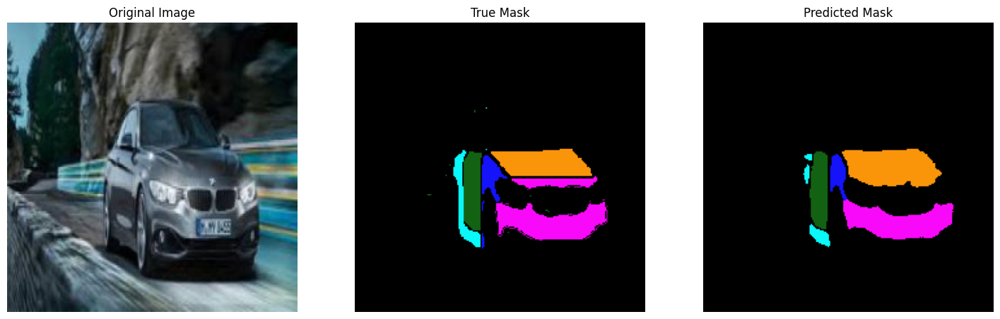

1/1 [==============================] - 0s 21ms/step


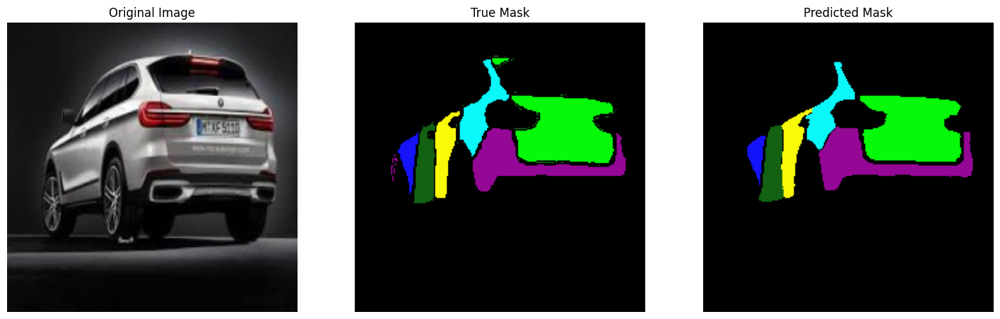

1/1 [==============================] - 0s 22ms/step


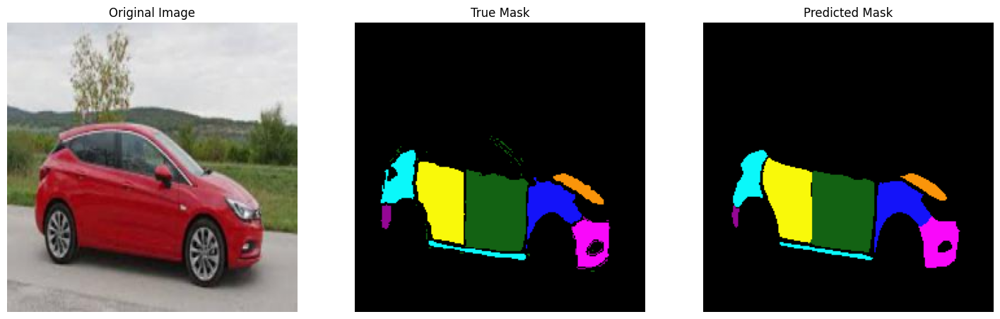

1/1 [==============================] - 0s 21ms/step


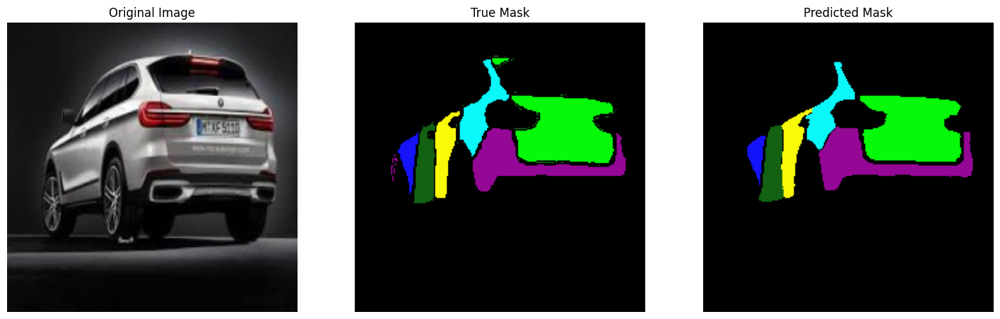

1/1 [==============================] - 0s 20ms/step


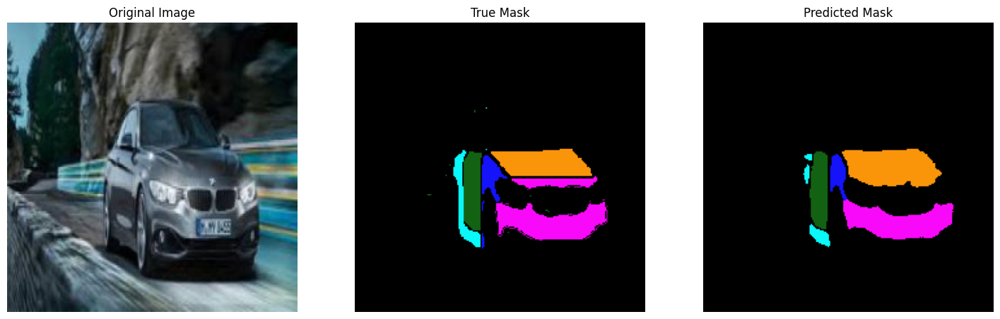

1/1 [==============================] - 0s 20ms/step


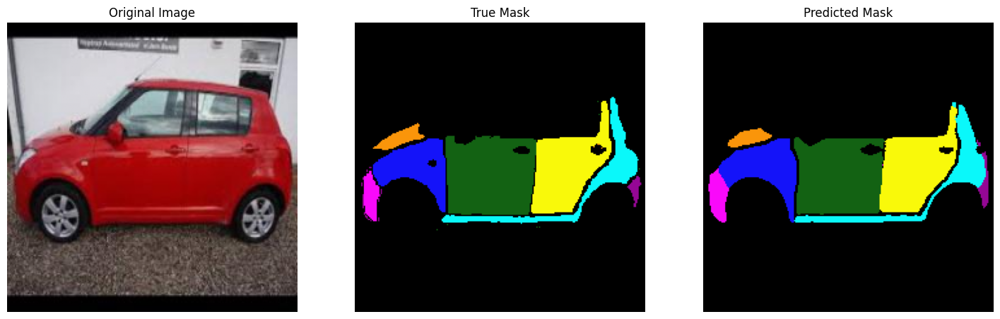

1/1 [==============================] - 0s 20ms/step


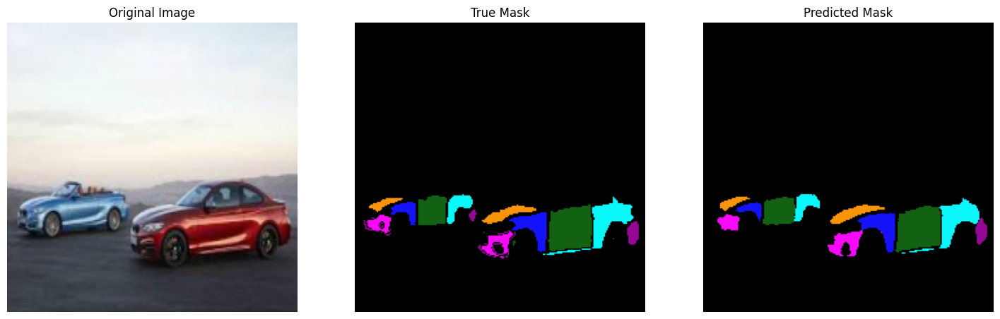

1/1 [==============================] - 0s 21ms/step


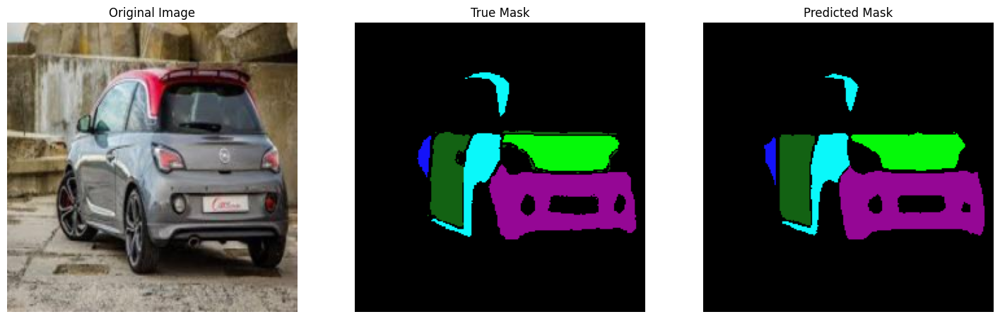

1/1 [==============================] - 0s 20ms/step


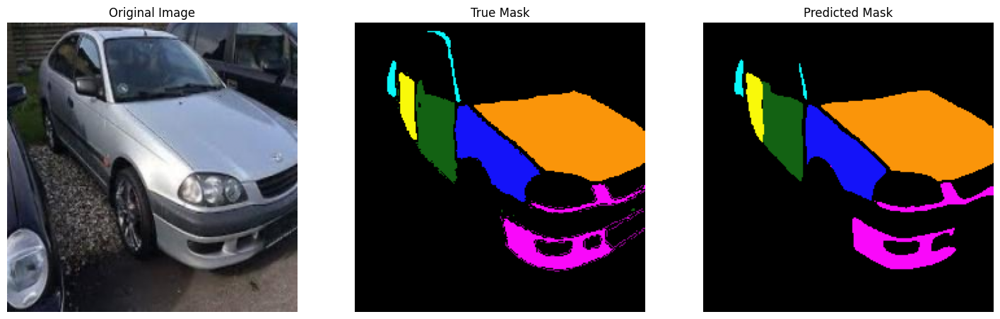

1/1 [==============================] - 0s 20ms/step


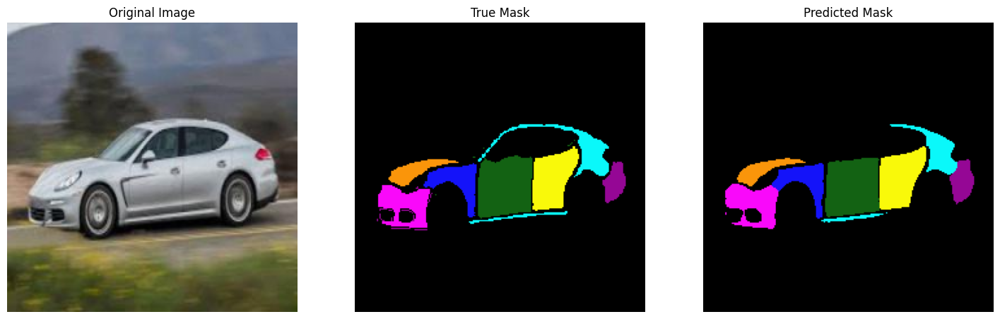

1/1 [==============================] - 0s 21ms/step


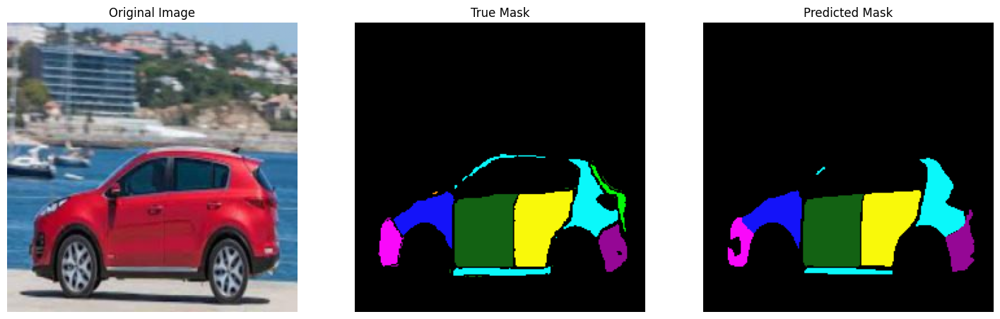

1/1 [==============================] - 0s 20ms/step


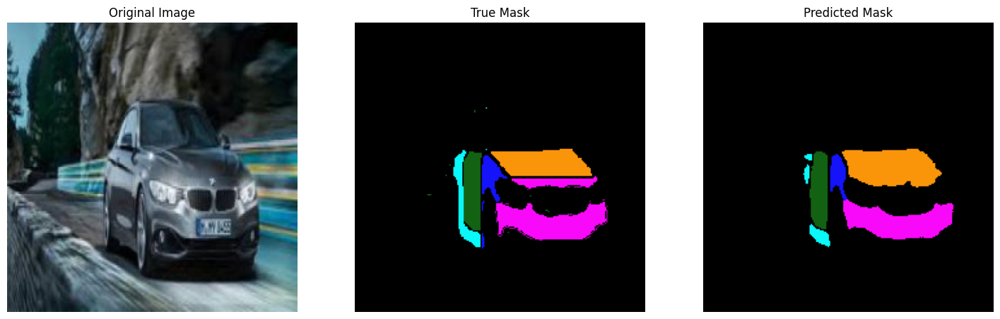

1/1 [==============================] - 0s 20ms/step


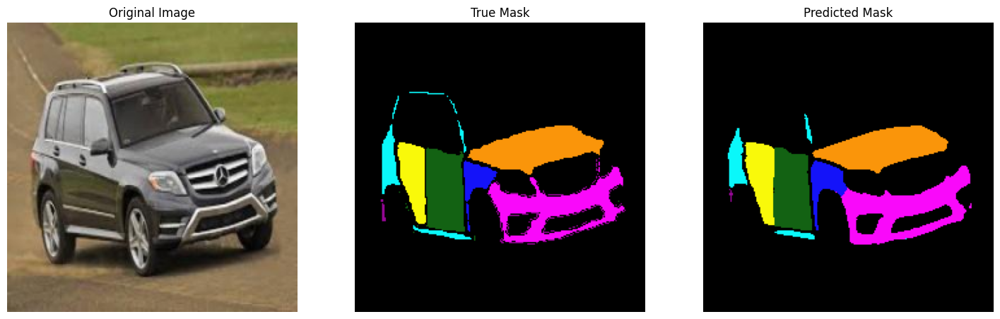

1/1 [==============================] - 0s 21ms/step


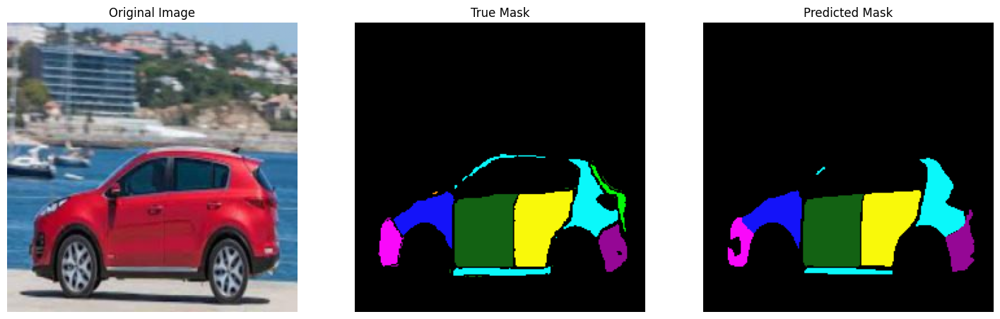

1/1 [==============================] - 0s 21ms/step


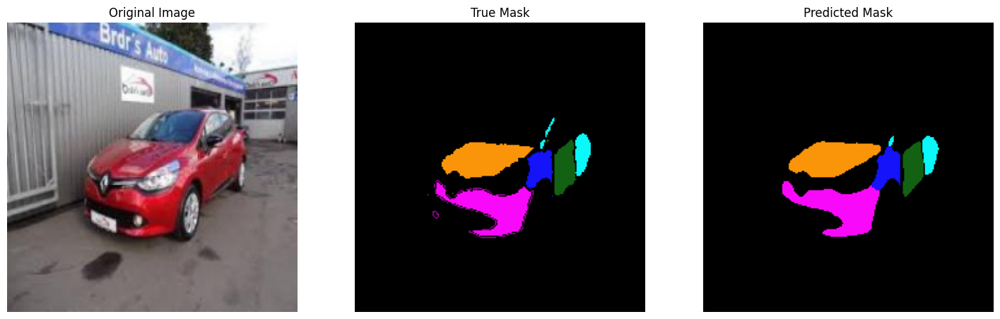

1/1 [==============================] - 0s 24ms/step


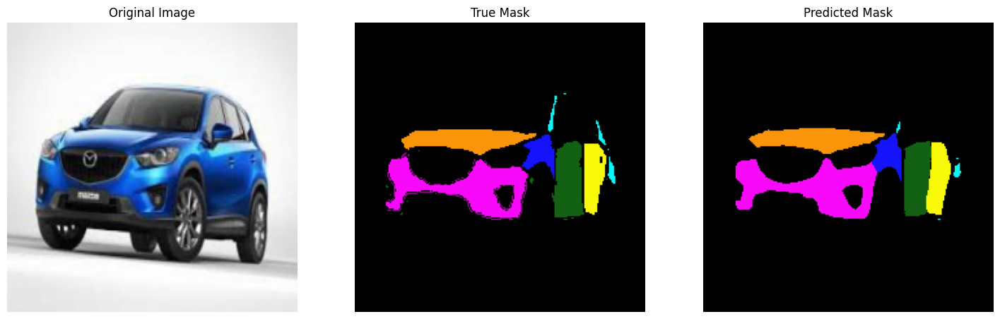

1/1 [==============================] - 0s 20ms/step


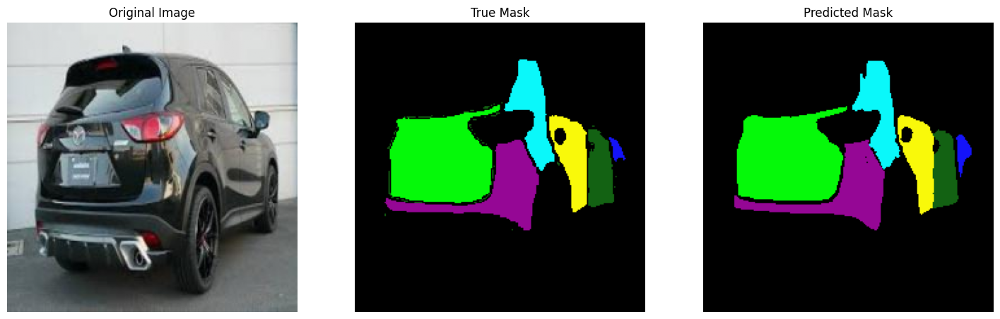

1/1 [==============================] - 0s 22ms/step


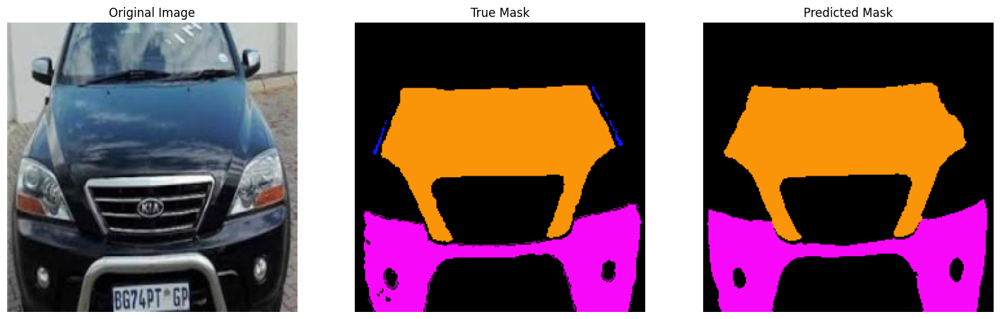

1/1 [==============================] - 0s 22ms/step


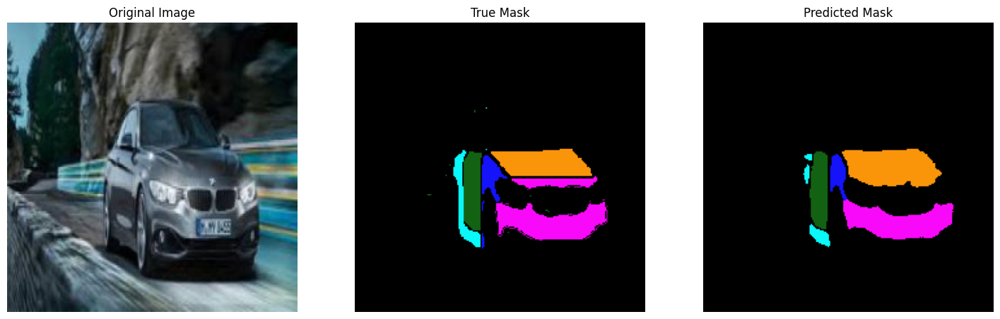

In [38]:
display_predictions_from_generator(model, test_gen, class_to_color, num_examples=30)